In [9]:
# necessary packages #

#using Pkg
#Pkg.add("Distances")
using Distributions
using Random
using Distances
using LinearAlgebra
using SparseArrays
using IterativeSolvers
using ProgressMeter
using JLD2

In [10]:
include("../../util.j")

LoadError: cannot declare ##17#18 constant; it already has a value

In [11]:
# unnecessary packages #

#using Pkg
#Pkg.add("UnicodePlots")
using UnicodePlots   # check the structure of the sparse matrix
using BenchmarkTools

using StatsPlots
using MCMCChains
using PrettyTables

In [12]:
#using Pkg
#Pkg.add("ProgressMeter");

In [13]:
@load "../data/sim3data.jld";

ErrorException: cannot declare ##19#20 constant; it already has a value

In [6]:
# priors #
q = 10; p = 3; K = 2
μβ = spzeros(p, q); inv_Vr = spzeros(p, p);
μΛ = spzeros(K, q); inv_VΛ = spzeros(K, K)
aΣ = 2; bΣ = fill(1.0, q);
ϕU = 300 / sqrt(2); ϕL = 3 / sqrt(2);
inv_Lr = spzeros(p, p); inv_LΛ = spzeros(K, K);

In [7]:
# Some data preparations #

m = 10; n = length(S);                                        # number of nearest neighbor                       
NN = BuildNN(coords_ord[:, S], m, 1.0);                            # build nearest neighbor 
nnIndx_col = vcat(NN.nnIndx, 1:n);                            # the index of columns
nnIndx_row = zeros(Int64, 0);                                               
for i in 2:m
    nnIndx_row = vcat(nnIndx_row, fill(i, i-1))
end
nnIndx_row = vcat(nnIndx_row, repeat((m + 1):n, inner = m), 1:n);  # the index of rows


In [16]:
# preallocation #
μ_m = [Array{Float64, 2}(undef, length(M_ind[i]), q) for i in 1:q];
nIndx = length(NN.nnIndx);
A = [Array{Float64}(undef, nIndx) for i in 1:K];
D = [Array{Float64}(undef, n) for i in 1:K];
I_A = [spzeros(n, n) for i in 1:K];
A_new = [Array{Float64}(undef, nIndx) for i in 1:K];
D_new = [Array{Float64}(undef, n) for i in 1:K];
I_A_new = [spzeros(n, n) for i in 1:K];
Ystar = vcat(Y_ord[S, :], inv_Lr * μβ, inv_LΛ * μΛ);             # will be updated after imputing missing response
Xstar = vcat([X_ord[S, :] spzeros(n, K)], [inv_Lr spzeros(p, K)], 
    [spzeros(K, p) inv_LΛ]);      
bstar = fill(0.0, q); astar = aΣ + 0.5 * n;
μγstar = vcat(μβ, μΛ); invVγstar = fill(0.0, p + K, p + K);
Y_Xm = spzeros(n + p + K, q);

MCMC sampling algorithm
Q1: priors for $\nu_i$ 
Q2: $\phi_i$ may not be consistant, since the order can change 

In [17]:
# Preallocation for MCMC samples and Initalization #
N_sam = 20000;
γ_sam = Array{Float64, 3}(undef, p + K, q, N_sam + 1);
Σ_sam = Array{Float64, 2}(undef, q, N_sam + 1);
F_sam = Array{Float64, 3}(undef, n, K, N_sam);
Y_m_sam =  [Array{Float64, 2}(undef, length(M_ind[i]), N_sam) for i in 1:q];
A_sam = Array{Float64, 1}(undef, N_sam); # acceptance rate
lh_old = 1; lh_new = 1;     # record the likelihood for updating ranges

ϕ_sam = Array{Float64, 2}(undef, K, N_sam + 1);

γ_sam[:, :, 1] = fill(0.0, p + K, q);
Σ_sam[:, 1] = fill(0.2, q);
ϕ_sam[:, 1] = fill(6.0, K);

precond_D = Array{Float64, 1}(undef, K * n);
inv_sqrt_Σ_diag = Array{Float64, 1}(undef, q);
RWM_scale = 0.3;                                              # random-walk metropolis step size scale

In [18]:
# for loop for MCMC chain #
Random.seed!(123);
prog = Progress(N_sam, 1, "Computing initial pass...", 50)
for l in 1:N_sam
    # Build the matrix D_Sigma_o^{1/2} #
    inv_sqrt_Σ_diag = 1 ./ (sqrt.(Σ_sam[:, l]));
    invD = Diagonal(vcat([inv_sqrt_Σ_diag[index_S_M[i, :] .> 0] for i in 1:N if (index_S[i] > 0)]...));
    if l == 1
        for k in 1:K
            getAD(coords_ord[:, S], NN.nnIndx, NN.nnDist, NN.nnIndxLU, ϕ_sam[k, l], 0.5, A[k], D[k]);
            I_A[k] = sparse(nnIndx_row, nnIndx_col, vcat(-A[k], ones(n)));
        end
    end
    Ytilde = vcat(invD * vcat([Y_ord[S_ind[ind], ind] - X_ord[S_ind[ind], :] * γ_sam[1:p, ind, l] 
                                for ind in 1:q]...)[perm_ind], zeros(K * n));
    Xtilde = vcat(invD * kron(sparse(transpose(γ_sam[(p + 1):(p + K), :, l])), 
                            sparse(1:N, 1:N, ones(N)))[obs_ind, 
                            vcat([S .+ (ind - 1) * N for ind in 1:K]...)][perm_ind, :],
             blockdiag([Diagonal(1 ./ sqrt.(D[ind])) * I_A[ind] for ind in 1:K]...));
                  
    # use LSMR to generate sample of F #       
    nsam = length(Ytilde);
    Precond_D = colnorm(Xtilde);
    F_sam[:, :, l] = reshape(Diagonal(1 ./ Precond_D) * lsmr(Xtilde * Diagonal(1 ./ Precond_D), 
                            Ytilde + rand(Normal(), nsam)), :, K);               
                    
    # impute missing response  over S#
    Xstar[1:n, (p + 1):(p + K)] = F_sam[:, :, l];        # update matrix Xstar with F
    for ind in 1:q
        #mul!(μ_m[ind], Xstar[M_Sind[ind], :], γ_sam[:, :, l]); #Xstar[M_Sind[ind], :] * γ_sam[:, ind, l]
        Y_m_sam[ind][:, l] = Xstar[M_Sind[ind], :] * γ_sam[:, ind, l]+    # μ_m[ind][:, ind] + 
            rand(Normal(0.0, sqrt(Σ_sam[ind, l])), length(M_ind[ind]));
    end
                        
    # use MNIW to sample γ Σ #
    for ind in 1:q
        Ystar[M_Sind[ind], ind] = Y_m_sam[ind][:, l]   # update Ystar with imputed response
    end
    
    invVγstar = cholesky(Xstar'Xstar);
    mul!(μγstar, transpose(Xstar), Ystar); μγstar = invVγstar.U \ (invVγstar.L \ μγstar);
    Y_Xm = Ystar - Xstar * μγstar;      # maybe improve?
    bstar = [bΣ[ind] + 0.5 * (norm(Y_Xm[:, ind])^2) for ind in 1:q];
    Σ_sam[:, l + 1] = [rand(InverseGamma(astar, bstar[ind]), 1)[1] for ind in 1:q];          # sample Σ
    γ_sam[:, :, l + 1] = (invVγstar.U \ reshape(rand(Normal(), (p + K) * q), (p + K), q)) * 
                    Diagonal(sqrt.(Σ_sam[:, l + 1])) + μγstar;          # sample γ    
    # use metropolis-hasting to update range
    ϕ_sam[:, l + 1] = ϕ_sam[:, l] + RWM_scale * rand(Normal(), K); # propose next sample point
                    
    
    if all(x -> (x < ϕU && x > ϕL), ϕ_sam[:, l + 1])
        lh_old = - 0.5 * sum([sum(log.(D[k])) + 
                              norm((I_A[k] * F_sam[:, k, l]) ./ sqrt.(D[k]))^2 for k in 1:K]);
        for k in 1:K
            getAD(coords_ord[:, S], NN.nnIndx, NN.nnDist, NN.nnIndxLU, 
                  ϕ_sam[k, l + 1], 0.5, A_new[k], D_new[k]);
            I_A_new[k] = sparse(nnIndx_row, nnIndx_col, vcat(-A_new[k], ones(n)));
        end
        lh_new = - 0.5 * sum([sum(log.(D_new[k])) + 
                              norm((I_A_new[k] * F_sam[:, k, l]) ./ sqrt.(D_new[k]))^2 for k in 1:K]);
        A_sam[l] = min(exp(lh_new - lh_old), 1.0);
        if rand(1)[1] < A_sam[l]
            I_A = copy(I_A_new); D = copy(D_new);
        else
            ϕ_sam[:, l + 1] = ϕ_sam[:, l]; # Don't update
        end         
    else
        A_sam[l] = 0.0;
        ϕ_sam[:, l + 1] = ϕ_sam[:, l];   # Don't update when falling out of the supports
    end                      
    
    next!(prog) # monitor the progress
end

Computing initial pass...100%|██████████████████████████████████████████████████| Time: 0:07:485:15


In [19]:
mean(A_sam)

0.3331442438385621

Posterior prediction

In [20]:
# prediction preparison
#N_pre_burn = Integer(trunc(0.75 * N_sam));
#M_ind = setdiff(1:N, S); NM = length(M_ind)
#F_M_sam = Array{Float64, 3}(undef, NM, K, N_sam - N_pre_burn + 1);
#Y_M_sam = Array{Float64, 3}(undef, NM, q, N_sam - N_pre_burn + 1);

# construct Atilde Dtilde #

#using RCall
#@rput coords_ord
#@rput S
#@rput m
#R"""
#library("RANN")
#nn_mod_ho <- nn2(t(coords_ord[, S]), t(coords_ord[, -S]), k = m)
#"""
#@rget nn_mod_ho
#Atilde = Array{Float64}(undef, NM * m); Dtilde = Array{Float64}(undef, NM);
#MnnIndxLU = collect(1:m:(NM * m + 1));
#MnnIndx = vec(nn_mod_ho[:nn_idx]');

In [21]:
#for i in N_pre_burn:N_sam
#    for j in 1:K
#        # update F
#        getAD(coords_ord[:, S], MnnIndx, vec(nn_mod_ho[:nn_dists]'), MnnIndxLU, 
#             ϕ_sam[j, i + 1], 0.5, Atilde, Dtilde)
#        AtildeM = sparse(repeat(1:NM, inner = m), MnnIndx, Atilde, NM, n);
#        F_M_sam[:, j, (i - N_pre_burn + 1)] = AtildeM * F_sam[:, j, i] + sqrt.(Dtilde) .* rand(Normal(), NM)
#    end 
#    # update Y
#    Y_M_sam[:, :, (i - N_pre_burn + 1)] = X_ord[M_ind, :] * γ_sam[1:p, :, i + 1] + 
#        F_M_sam[:, :, (i - N_pre_burn + 1)] *  γ_sam[(p + 1):(p + K), :, i + 1] + 
#        transpose(rand(MvNormal(Σ_sam[:, :, i + 1]), NM))
#end

# MCMC Chain check

In [22]:
β_pos_sam = Array{Float64, 3}(undef, N_sam + 1, p * q, 1);
β_pos_sam[:, :, 1] = hcat([γ_sam[i, j, :] for i in 1:p, j in 1:q]...);
β_chain = Chains(β_pos_sam);
pβ = plot(β_chain)

In [23]:
β

3×10 Array{Float64,2}:
  1.0  -1.0    1.0  -0.5   2.0  -1.5   0.5   0.3  -2.0   1.5
 -5.0   2.0    3.0  -2.0  -6.0   4.0   5.0  -3.0   6.0  -4.0
  8.0   6.9  -12.0   0.0  -4.0   7.7  -8.8   3.3   6.6  -5.5

In [24]:
Λ_pos_sam = Array{Float64, 3}(undef, N_sam + 1, K * q, 1);
Λ_pos_sam[:, :, 1] = hcat([γ_sam[p + i, j, :] for i in 1:K, j in 1:q]...)
Λ_chain = Chains(Λ_pos_sam);
#pΛ = plot(Λ_chain)

In [25]:
Λ

5-element Array{Array{Float64,2},1}:
 [0.130044 -0.0289222 … 0.305525 0.264754; 0.0688177 -0.179345 … 0.127981 0.1679; … ; 0.0939935 0.234345 … 0.354274 0.384877; -0.171442 -0.232616 … -0.268721 0.369819]     
 [0.185065 -0.0558782 … 0.0867885 -0.55239; 0.775192 -0.126688 … 0.0377201 -0.494974; … ; -0.358786 -0.774431 … 0.658787 -0.76833; 0.762212 -0.771457 … -0.522754 -0.716634]
 [0.691138 0.022232 … -0.805842 -0.0223612; -0.25037 0.309294 … 0.311741 0.55864; … ; 0.227933 -0.337321 … 0.863367 -0.20838; 0.179381 0.239937 … 0.780241 -0.686083]       
 [0.551298 1.05886 … -0.386289 -1.04071; -0.403397 0.717535 … -1.08726 0.704522; … ; 0.395563 0.251704 … -0.603928 -0.66962; 0.385119 0.647842 … -1.1866 -1.46466]          
 [0.782915 0.473769 … 0.790897 -0.297221; -0.162902 1.29429 … 1.64004 -1.00375; … ; -1.31956 -0.271109 … 1.96226 1.76631; 1.15007 1.49836 … -1.51572 -1.7759]               

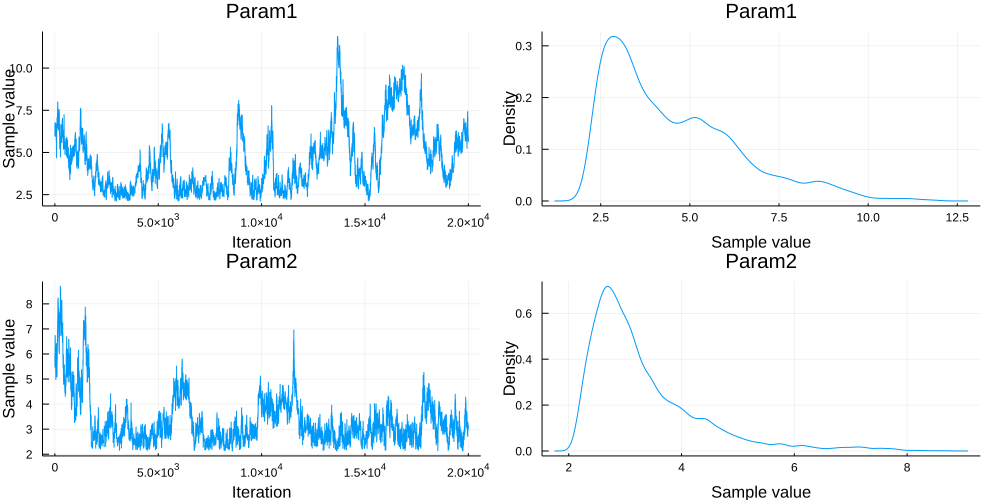

In [26]:
ϕ_pos_sam = Array{Float64, 3}(undef, N_sam + 1, K, 1);
ϕ_pos_sam[:, :, 1] = hcat([ϕ_sam[i, :] for i in 1:K]...);
ϕ_chain = Chains(ϕ_pos_sam);
pϕ = plot(ϕ_chain)

In [27]:
Σ_pos_sam = Array{Float64, 3}(undef, N_sam + 1, q, 1);
Σ_pos_sam[:, :, 1] = hcat([Σ_sam[ind, :] for ind in 1:q]...);
Σ_chain = Chains(Σ_pos_sam);
pΣ = plot(Σ_chain)

In [28]:
sqrt_Σ_diag.^2

10-element Array{Float64,1}:
 0.5000000000000001 
 1.0                
 0.4                
 2.0000000000000004 
 0.29999999999999993
 2.5000000000000004 
 3.5                
 0.45               
 1.4999999999999998 
 0.5000000000000001 

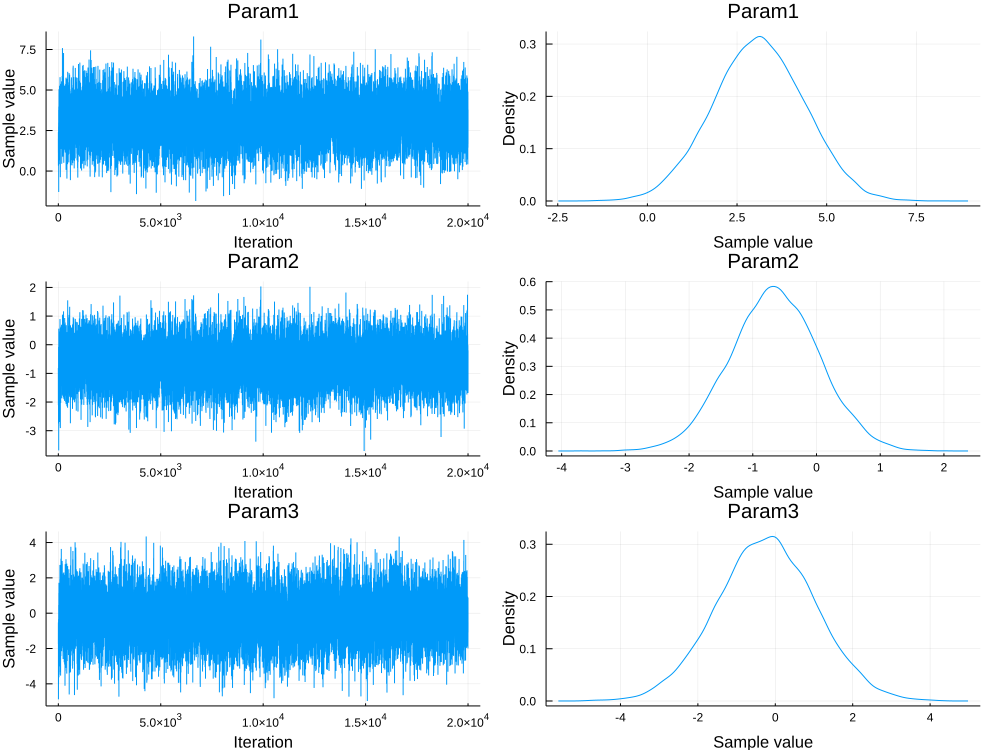

In [29]:
ω_incp_obs_pos_sam = Array{Float64, 3}(undef, n, q, N_sam);
lll = fill(1.0, (n, 1));
for i in 1:N_sam
    ω_incp_obs_pos_sam[:, :, i] = F_sam[:, :, i] * γ_sam[(p + 1):(p + K), :, i + 1] + 
                     lll * transpose(γ_sam[1, :, i + 1]);
end
truncindex = 1;#Integer(trunc(N_sam / 2));
ω_incp_pos_sam = Array{Float64, 3}(undef, N_sam - truncindex  + 1, 3, 1);
ω_incp_pos_sam[:, :, 1] = hcat(ω_incp_obs_pos_sam[1, 1, truncindex:N_sam], 
    ω_incp_obs_pos_sam[1, 2, truncindex:N_sam], ω_incp_obs_pos_sam[200, 1, truncindex:N_sam]);
ω_incp_chain = Chains(ω_incp_pos_sam);
pΣ = plot(ω_incp_chain)

In [30]:
# check the variance covariance across latent process
cov_pos = Array{Float64, 3}(undef, q, q, N_sam);
for i in 1:N_sam
    cov_pos[:, :, i] = cov(F_sam[:, :, i] * γ_sam[(p + 1):(p + K), :, i + 1])
end   
# ω_incp_obs_pos_sam[:, :, i]
cov_pos_sam = Array{Float64, 3}(undef, N_sam, q * q, 1);
cov_pos_sam[:, :, 1] = hcat([cov_pos[i, j, :] for i in 1:q, j in 1:q]...);
cov_pos_chain = Chains(cov_pos_sam);
#pcov = plot(cov_pos_chain)

In [31]:
covω = cov(ω_ord[S, :])

10×10 Array{Float64,2}:
  25.3808     7.60466     9.79245   …  -0.859226  -18.197     -11.1629  
   7.60466   18.2329      2.28601      -0.181906   -6.16284    -6.00531 
   9.79245    2.28601    29.5927        0.248116  -15.4448    -10.8923  
  -2.04999    4.72879    -6.63682      -4.7299      1.42522    -0.550013
  -1.25728    7.50492    -2.7964        2.56391    -1.73796    -0.341501
  12.1198     2.51267    11.7798    …   0.435206  -10.2852    -11.9809  
 -10.5902    -6.36495     5.03186      -0.673167   -0.655199   -0.213824
  -0.859226  -0.181906    0.248116     25.1696      9.2675      2.94299 
 -18.197     -6.16284   -15.4448        9.2675     34.803      12.8841  
 -11.1629    -6.00531   -10.8923        2.94299    12.8841     25.3644  

# Posterior Inference 

In [32]:
N_Inf_burn = Integer(trunc(0.75 * N_sam));
ω_incp_obs_pos_qt = Array{Float64, 3}(undef, n, q, 3);
for j in 1:q
    for i in 1:n
        ω_incp_obs_pos_qt[i, j, :] = quantile(ω_incp_obs_pos_sam[i, j, N_Inf_burn:N_sam], [0.025, 0.5, 0.975])
    end
end
# count the covarage of 95% CI #
count_ω_incp = fill(0.0, q);
for j in 1:q
    for i in 1:n
        count_ω_incp[j] = count_ω_incp[j] + 
        ((ω_incp_obs_pos_qt[i, j, 1] < ω_incp_obs[S[i], j]) && 
            (ω_incp_obs_pos_qt[i, j, 3] > ω_incp_obs[S[i], j]))
    end
end
count_ω_incp

10-element Array{Float64,1}:
 1004.0
  302.0
 1164.0
  215.0
  196.0
  370.0
  396.0
  200.0
  527.0
  352.0

In [33]:
count_ω_incp ./ n

10-element Array{Float64,1}:
 0.8366666666666667 
 0.25166666666666665
 0.97               
 0.17916666666666667
 0.16333333333333333
 0.30833333333333335
 0.33               
 0.16666666666666666
 0.43916666666666665
 0.29333333333333333

In [34]:
sum(count_ω_incp) / (q*n)

0.3938333333333333

In [35]:
summary_table = Array{Float64, 2}(undef, 15, 5);
summary_table[1, :] = vcat(β[2, 1], mean(γ_sam[2, 1, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[2, :] = vcat(β[3, 1], mean(γ_sam[3, 1, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[3, :] = vcat(β[2, 2], mean(γ_sam[2, 2, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[4, :] = vcat(β[3, 2], mean(γ_sam[3, 2, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[5, :] = vcat(β[2, 3], mean(γ_sam[2, 3, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[6, :] = vcat(β[3, 3], mean(γ_sam[3, 3, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[7, :] = vcat(sqrt_Σ_diag[1]^2, mean(Σ_sam[1, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[8, :] = vcat(sqrt_Σ_diag[2]^2, mean(Σ_sam[2, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[9, :] = vcat(sqrt_Σ_diag[3]^2, mean(Σ_sam[3, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[10, :] = vcat(sqrt_Σ_diag[4]^2, mean(Σ_sam[4, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[4, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[11, :] = vcat(covω[1, 1], mean(cov_pos_sam[N_Inf_burn:N_sam, 1, 1]),
    quantile(cov_pos_sam[N_Inf_burn:N_sam, 1, 1], [0.5, 0.025, 0.975]));
summary_table[12, :] = vcat(covω[1, 2], mean(cov_pos_sam[N_Inf_burn:N_sam, 2, 1]),
    quantile(cov_pos_sam[N_Inf_burn:N_sam, 2, 1], [0.5, 0.025, 0.975]));
summary_table[13, :] = vcat(ϕ[1], mean(ϕ_sam[1, N_Inf_burn:N_sam]),
    quantile(ϕ_sam[1, N_Inf_burn:N_sam], [0.5, 0.025, 0.975]));
summary_table[14, :] = vcat(ϕ[2], mean(ϕ_sam[2, N_Inf_burn:N_sam]),
    quantile(ϕ_sam[2, N_Inf_burn:N_sam], [0.5, 0.025, 0.975]));
summary_table[15, :] = vcat(ϕ[3], mean(ϕ_sam[3, N_Inf_burn:N_sam]),
    quantile(ϕ_sam[3, N_Inf_burn:N_sam], [0.5, 0.025, 0.975]));
summary_table = round.(summary_table; digits = 3);
rnames = ["β[2, 1]", "β[2, 2]", "β[3, 1]", "β[3, 2]", "β[4, 1]", "β[4, 2]", "Σ[1, 1]", 
    "Σ[2, 2]", "Σ[3, 3]", "Σ[4, 4]", "cov(ω)[1, 1]", "cov(ω)[1, 2]", "ϕ1", "ϕ2", "ϕ3"];
summary_table = [rnames summary_table];
pretty_table(summary_table,  ["" "true" "mean" "median" "2.5%" "97.5%"], markdown)

BoundsError: BoundsError: attempt to access 2×20001 Array{Float64,2} at index [3, 15000:20000]

In [36]:
summary_table = Array{Float64, 2}(undef, 20, 5);
summary_table[1, :] = vcat(β[2, 1], mean(γ_sam[2, 1, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[2, :] = vcat(β[2, 2], mean(γ_sam[2, 2, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[3, :] = vcat(β[2, 3], mean(γ_sam[2, 3, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[4, :] = vcat(β[2, 4], mean(γ_sam[2, 4, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 4, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[5, :] = vcat(β[2, 5], mean(γ_sam[2, 5, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 5, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[6, :] = vcat(β[2, 6], mean(γ_sam[2, 6, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 6, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[7, :] = vcat(β[2, 7], mean(γ_sam[2, 7, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 7, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[8, :] = vcat(β[2, 8], mean(γ_sam[2, 8, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 8, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[9, :] = vcat(β[2, 9], mean(γ_sam[2, 9, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 9, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[10, :] = vcat(β[2, 10], mean(γ_sam[2, 10, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[2, 10, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[11, :] = vcat(β[3, 1], mean(γ_sam[3, 1, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[12, :] = vcat(β[3, 2], mean(γ_sam[3, 2, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[13, :] = vcat(β[3, 3], mean(γ_sam[3, 3, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[14, :] = vcat(β[3, 4], mean(γ_sam[3, 4, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 4, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[15, :] = vcat(β[3, 5], mean(γ_sam[3, 5, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 5, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[16, :] = vcat(β[3, 6], mean(γ_sam[3, 6, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 6, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[17, :] = vcat(β[3, 7], mean(γ_sam[3, 7, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 7, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[18, :] = vcat(β[3, 8], mean(γ_sam[3, 8, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 8, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[19, :] = vcat(β[3, 9], mean(γ_sam[3, 9, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 9, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[20, :] = vcat(β[3, 10], mean(γ_sam[3, 10, N_Inf_burn:(N_sam + 1)]),
    quantile(γ_sam[3, 10, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table = round.(summary_table; digits = 3);
rnames = ["β[2, 1]", "β[2, 2]", "β[2, 3]", "β[2, 4]", "β[2, 5]", "β[2, 6]", "β[2, 7]", 
    "β[2, 8]", "β[2, 9]", "β[2, 10]", "β[3, 1]", "β[3, 2]", "β[3, 3]", "β[3, 4]", 
    "β[3, 5]", "β[3, 6]", "β[3, 7]", "β[3, 8]", "β[3, 9]", "β[3, 10]"];
summary_table = [rnames summary_table];
pretty_table(summary_table,  ["" "true" "mean" "median" "2.5%" "97.5%"], markdown)

|          |  true |    mean |  median |    2.5% |   97.5% |
|----------|-------|---------|---------|---------|---------|
|  β[2, 1] |  -5.0 |  -5.273 |  -5.273 |  -5.832 |  -4.719 |
|  β[2, 2] |   2.0 |   2.321 |   2.317 |     1.5 |   3.152 |
|  β[2, 3] |   3.0 |   2.833 |   2.831 |   2.407 |   3.274 |
|  β[2, 4] |  -2.0 |  -1.059 |  -1.059 |  -2.281 |   0.192 |
|  β[2, 5] |  -6.0 |  -6.435 |  -6.447 |  -7.463 |  -5.362 |
|  β[2, 6] |   4.0 |   4.229 |   4.224 |    3.35 |   5.126 |
|  β[2, 7] |   5.0 |   5.038 |   5.048 |   3.921 |   6.163 |
|  β[2, 8] |  -3.0 |  -3.085 |  -3.081 |  -4.172 |  -2.027 |
|  β[2, 9] |   6.0 |   6.198 |   6.201 |   5.221 |   7.186 |
| β[2, 10] |  -4.0 |  -3.677 |  -3.677 |  -4.594 |  -2.781 |
|  β[3, 1] |   8.0 |   8.273 |   8.279 |   7.714 |   8.807 |
|  β[3, 2] |   6.9 |   6.219 |   6.215 |   5.337 |   7.103 |
|  β[3, 3] | -12.0 | -12.156 | -12.159 | -12.571 | -11.721 |
|  β[3, 4] |   0.0 |   0.293 |   0.303 |  -0.979 |   1.538 |
|  β[3, 5] |  -4.0 |  -2

In [37]:
summary_table = Array{Float64, 2}(undef, 10, 5);
summary_table[1, :] = vcat(sqrt_Σ_diag[1]^2, mean(Σ_sam[1, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[1, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[2, :] = vcat(sqrt_Σ_diag[2]^2, mean(Σ_sam[2, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[2, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[3, :] = vcat(sqrt_Σ_diag[3]^2, mean(Σ_sam[3, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[3, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[4, :] = vcat(sqrt_Σ_diag[4]^2, mean(Σ_sam[4, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[4, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[5, :] = vcat(sqrt_Σ_diag[5]^2, mean(Σ_sam[5, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[5, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[6, :] = vcat(sqrt_Σ_diag[6]^2, mean(Σ_sam[6, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[6, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[7, :] = vcat(sqrt_Σ_diag[7]^2, mean(Σ_sam[7, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[7, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[8, :] = vcat(sqrt_Σ_diag[8]^2, mean(Σ_sam[8, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[8, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[9, :] = vcat(sqrt_Σ_diag[9]^2, mean(Σ_sam[9, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[9, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table[10, :] = vcat(sqrt_Σ_diag[10]^2, mean(Σ_sam[10, N_Inf_burn:(N_sam + 1)]),
    quantile(Σ_sam[10, N_Inf_burn:(N_sam + 1)], [0.5, 0.025, 0.975]));
summary_table = round.(summary_table; digits = 3);
rnames = ["Σ[1, 1]", "Σ[2, 2]", "Σ[3, 3]", "Σ[4, 4]", "Σ[5, 5]", "Σ[6, 6]", "Σ[7, 7]", 
    "Σ[8, 8]", "Σ[9, 9]", "Σ[10, 10]"];
summary_table = [rnames summary_table];
pretty_table(summary_table,  ["" "true" "mean" "median" "2.5%" "97.5%"], markdown)

|           | true |   mean | median |   2.5% |  97.5% |
|-----------|------|--------|--------|--------|--------|
|   Σ[1, 1] |  0.5 |   4.26 |  4.251 |  3.276 |  5.366 |
|   Σ[2, 2] |  1.0 | 15.535 | 15.519 | 14.124 | 17.038 |
|   Σ[3, 3] |  0.4 |  0.587 |  0.509 |  0.203 |  1.301 |
|   Σ[4, 4] |  2.0 | 33.413 | 33.361 |  30.66 | 36.429 |
|   Σ[5, 5] |  0.3 | 25.117 | 25.064 | 23.017 | 27.479 |
|   Σ[6, 6] |  2.5 | 16.181 | 16.159 | 14.779 | 17.751 |
|   Σ[7, 7] |  3.5 |  25.74 | 25.697 | 23.371 | 28.329 |
|   Σ[8, 8] | 0.45 | 25.299 | 25.272 |  23.18 | 27.584 |
|   Σ[9, 9] |  1.5 | 19.373 | 19.338 | 17.499 | 21.447 |
| Σ[10, 10] |  0.5 | 17.413 | 17.414 | 15.798 | 19.148 |


In [38]:
N_Inf_burn

15000

In [39]:
N_Inf_burn = Integer(trunc(0.75 * N_sam));
count_Y_M = fill(0.0, q);
Y_m_pos_qt = [Array{Float64, 2}(undef, length(M_ind[ind]), 3) for ind in 1:q];
Y_m_pos_mean = [Array{Float64, 1}(undef, length(M_ind[ind])) for ind in 1:q]
for i in 1:q
    for j in 1:length(M_ind[i])
        Y_m_pos_qt[i][j, :] = quantile(Y_m_sam[i][j, N_Inf_burn:N_sam], [0.025, 0.5, 0.975]);
        Y_m_pos_mean[i][j] = mean(Y_m_sam[i][j, N_Inf_burn:N_sam])
    end
end
for i in 1:q
    for j in 1:length(M_ind[i])
        count_Y_M[i] = count_Y_M[i] + ((Y_m_pos_qt[i][j, 1] < Y_ord[M_ind[i][j], i]) && 
         (Y_m_pos_qt[i][j, 3] > Y_ord[M_ind[i][j], i]))
    end
end
count_Y_M

10-element Array{Float64,1}:
 194.0
 194.0
 188.0
 190.0
 185.0
 194.0
 190.0
 189.0
 189.0
 193.0

In [40]:
count_Y_M ./ 200

10-element Array{Float64,1}:
 0.97 
 0.97 
 0.94 
 0.95 
 0.925
 0.97 
 0.95 
 0.945
 0.945
 0.965

In [41]:
sum(count_Y_M)/ (q*200)

0.953

In [42]:
SPE = fill(0.0, q)
for i in 1:q
    for j in 1:length(M_ind[i])
        SPE[i] = SPE[i] + (Y_m_pos_mean[i][j] -  Y_ord[M_ind[i][j], i])^2
    end
end
sqrt.(SPE ./ 200 )

10-element Array{Float64,1}:
 2.406132889843148 
 3.9455306770701073
 2.310200304326267 
 5.906786349989382 
 5.39668236643106  
 4.037474455340052 
 5.088004023970464 
 4.88324780781536  
 4.428047021772365 
 4.253498005234553 

In [43]:
sqrt(sum(SPE) / (200*q))

4.4095686703749415

In [44]:
N_Inf_burn = Integer(trunc(0.75 * N_sam));
count_cov = 0.0
for i in 1:q
    for j in i:q
        count_cov = count_cov + ((quantile(cov_pos[i, j, N_Inf_burn:N_sam], [0.025])[1] < (covω[i, j])) 
         && (quantile(cov_pos[i, j, N_Inf_burn:N_sam], [0.975])[1] > (covω[i, j])))
    end
end
count_cov

21.0

In [45]:
#@save "../results/ω_incp_obs_pos_qt_BSLMC.jld"  ω_incp_obs_pos_qt